In [1]:
#### Imports ####
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from matplotlib.pyplot import imshow, show, subplot,title,axis
from matplotlib.patches import Circle
from skimage.io import imread
from skimage import img_as_float,img_as_ubyte
from skimage.color import rgb2hsv,hsv2rgb,rgb2gray
import skimage.util
import skimage as sk
import scipy
import scipy.ndimage
import scipy.signal
import scipy.signal as signal
from scipy.signal import convolve,gaussian
from scipy.signal import convolve2d
from timeit import timeit
import numpy as np
import matplotlib.pyplot as plt
from scipy import fftpack
from scipy import ndimage
from skimage.feature import corner_peaks,peak_local_max
import matplotlib.patches as patches
from matplotlib.colors import LinearSegmentedColormap
import os
from skimage import morphology

c:\Users\George\anaconda3\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


In [2]:
def compute_cdf(histogram):
    # Compute the cumulative sum of the histogram
    cumulative_histogram = np.cumsum(histogram)
    # Normalize the cumulative histogram to obtain the CDF
    cdf = cumulative_histogram / np.sum(histogram)
    return cdf

def C(image, cdf):
    c = cdf[image]
    return c

def custom_colormap():
    n_intervals = 10  # Number of intervals for variations
    intervals = np.linspace(0, 1, n_intervals)
    cmap_dict = {'red': [], 'green': [], 'blue': []}
    for interval in intervals:
        r = 1  # Max intensity (red)
        g = 0  # Min intensity (green)
        b = 0  # Min intensity (blue)
        cmap_dict['red'].append((interval, r, r))
        cmap_dict['green'].append((interval, g, g))
        cmap_dict['blue'].append((interval, b, b))
    custom_cmap = LinearSegmentedColormap('custom', cmap_dict)
    return custom_cmap

In [3]:
def load_images_from_folder(folder_path):
    """
    Load all images from the specified folder and return them as a list of images read by OpenCV.
    """
    images = []
    for filename in os.listdir(folder_path):
        image_path = os.path.join(folder_path, filename)
        img = imread(image_path)
        if img is not None:
            images.append(img)
        else:
            print(f"Error loading image {filename}")
    return images

# path = r"C:\Users\George\Desktop\Final_Project\Images\Control"
path = r"C:\Users\George\Desktop\Final_Project\Images\Penetramax"
Images = load_images_from_folder(path)

In [4]:
channels = [1, 2, 3] 
HE_Images = []
HE_all_Images = []
CLAHE_Images = []

for j in range(len(Images)):
    I = np.copy(Images[j])
    # for i in range(len(channels)):
        # O[:, :, i] = morphology.opening(np.copy(I[:, :, i]), morphology.disk(radius = 5))

    #     channel_I = I[:, :, i]
    #     hist, edges = np.histogram(channel_I.flatten(), bins = 512, range = [0, 512])
    #     CDF = compute_cdf(hist)
    #     I[:,:,i] = C(channel_I, CDF)*255
    channel_I = I[:, :, 0]
    hist, edges = np.histogram(channel_I.flatten(), bins = 512, range = [0, 512])
    CDF = compute_cdf(hist)
    I[:,:,0] = C(channel_I, CDF)*255
    HE_Images.append(np.copy(I))
    I_new = skimage.exposure.equalize_adapthist(np.copy(Images[j]), kernel_size=10, clip_limit=0.08, nbins=512)
    CLAHE_Images.append(I_new)
    # M_Images.append(O)

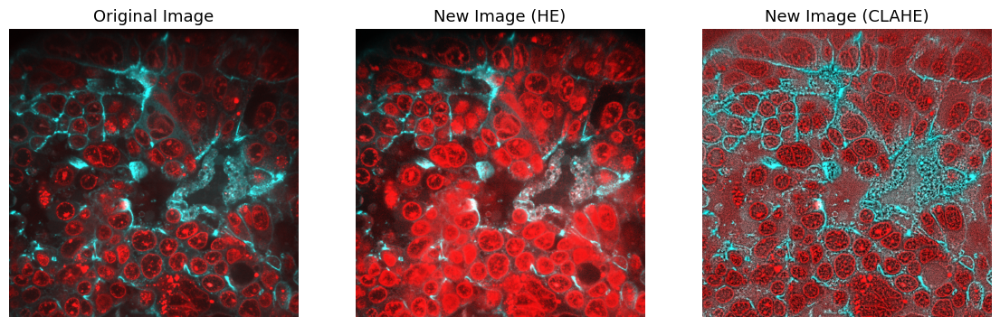

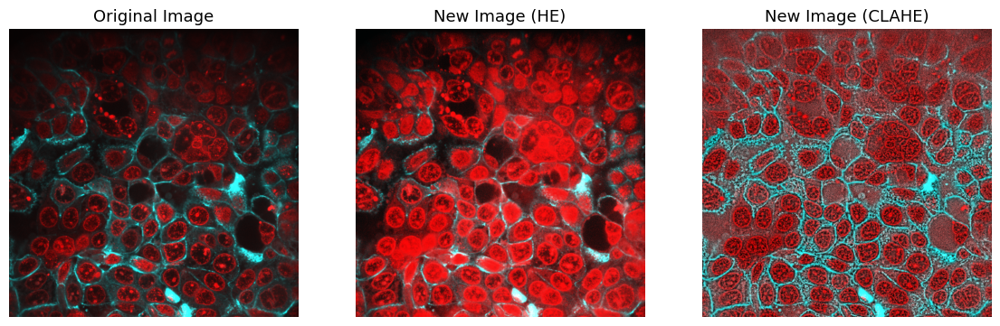

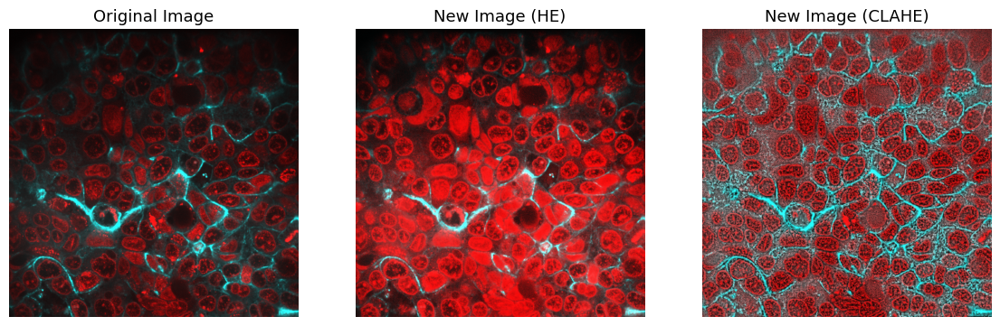

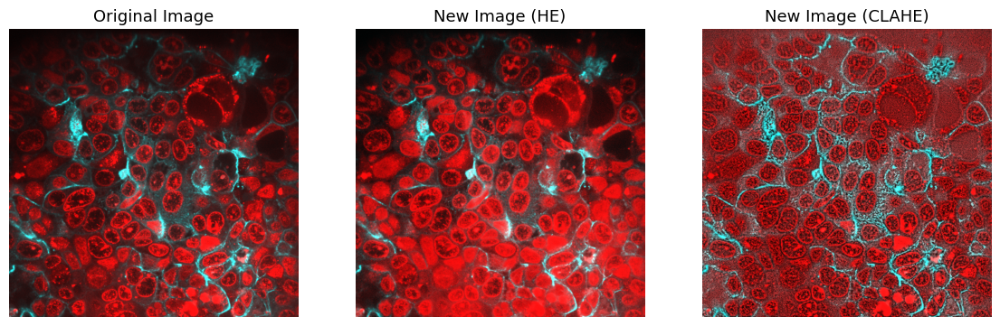

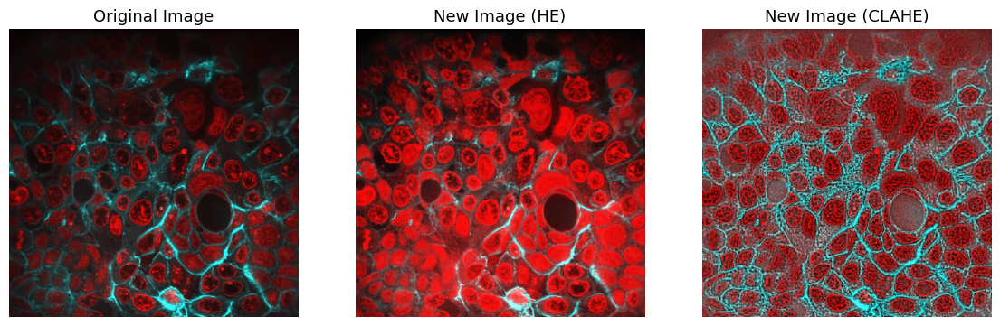

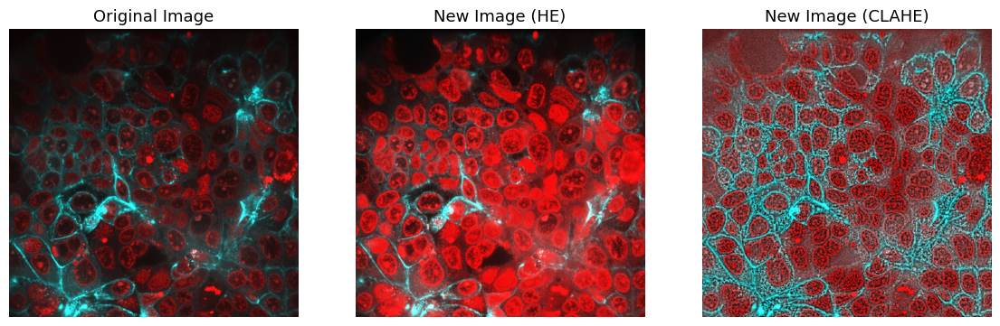

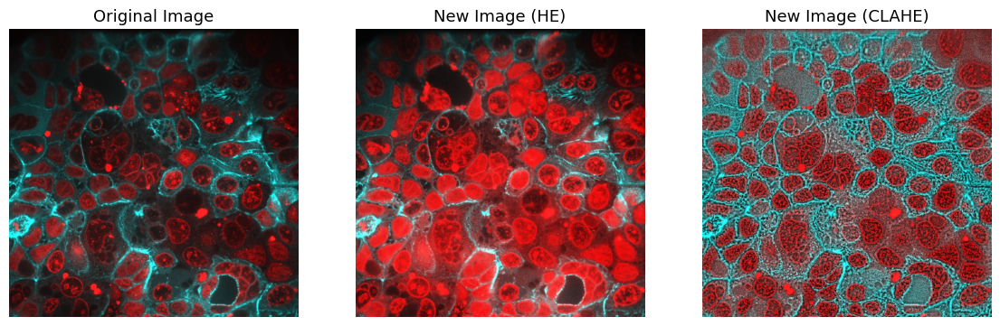

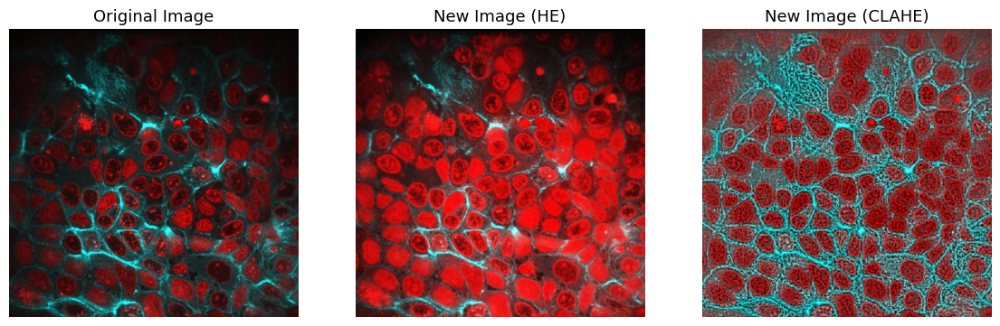

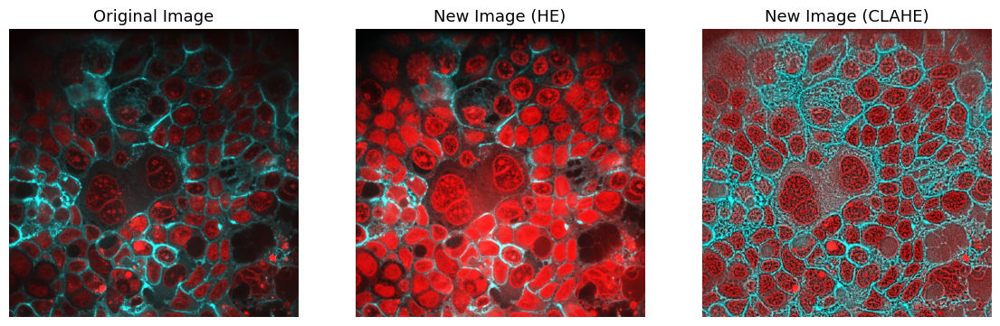

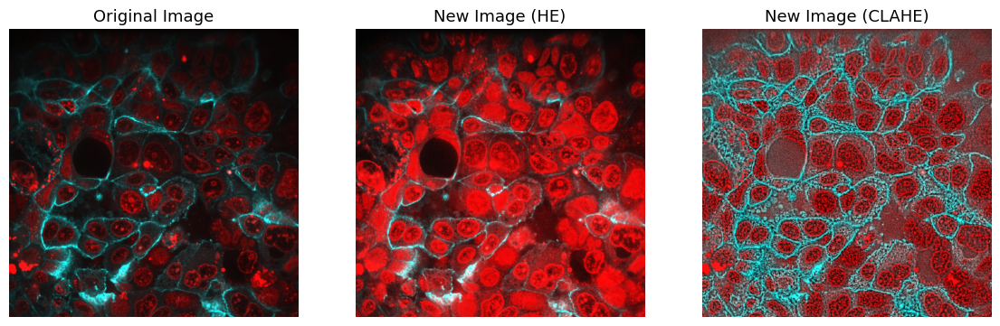

In [5]:
####Visualization####
for i in range(len(Images)):
    fig, ax = plt.subplots(1, 3, figsize = (14,6))
    ax[0].imshow(Images[i])
    ax[0].axis('off')
    ax[0].set_title('Original Image', fontsize = 13)
    ax[1].imshow(HE_Images[i])
    ax[1].axis('off')
    ax[1].set_title('New Image (HE)', fontsize = 13)
    ax[2].imshow(CLAHE_Images[i])
    ax[2].axis('off')
    ax[2].set_title('New Image (CLAHE)', fontsize = 13)

plt.show()

In [6]:
import matplotlib.pyplot as plt
from cellpose import models, io
from cellpose.io import imread, logger_setup
import numpy as np

# io.logger_setup() #Activate for info while running

# Load the Cellpose model
model = models.Cellpose(model_type='nuclei', gpu=True)

nuclei = []
nuclei_HE = []
nuclei_CLAHE = []
for i in range(len(Images)):
    masks, flows, styles, diams = model.eval(Images[i], diameter=40, channels=[1, 0])
    nuclei.append(masks)
    masks, flows, styles, diams = model.eval(HE_Images[i], diameter=40, channels=[1, 0])
    nuclei_HE.append(masks)
    masks, flows, styles, diams = model.eval(CLAHE_Images[i], diameter=40, channels=[1, 0])
    nuclei_CLAHE.append(masks)

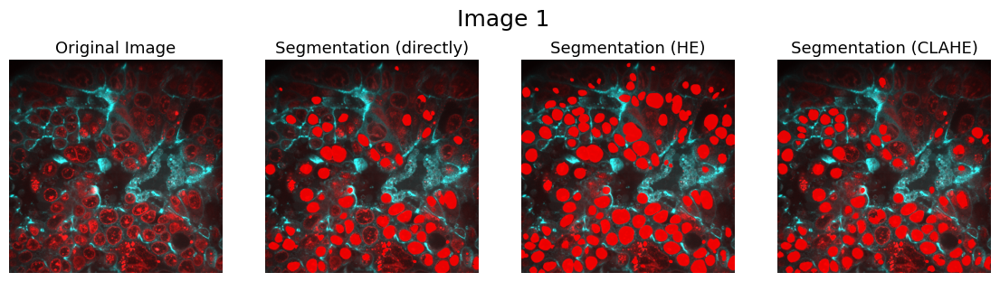

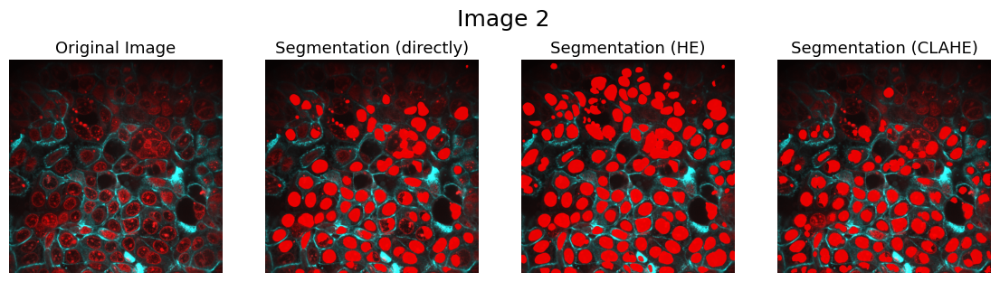

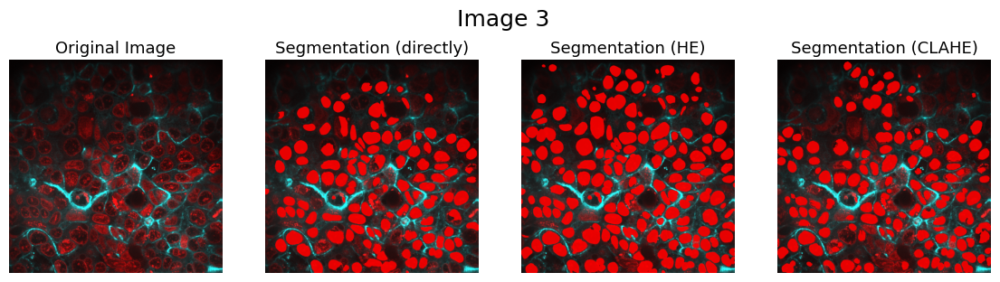

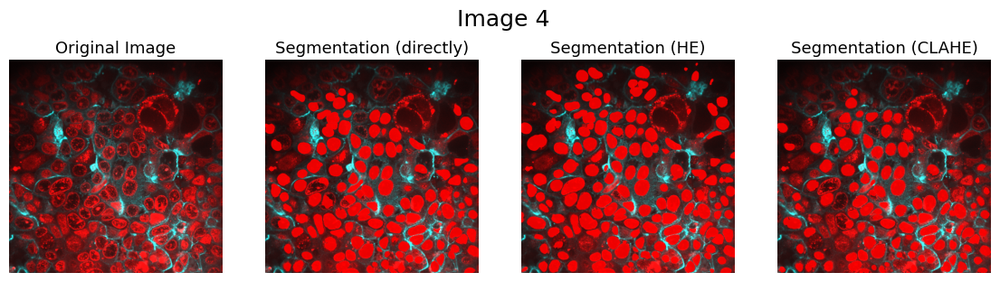

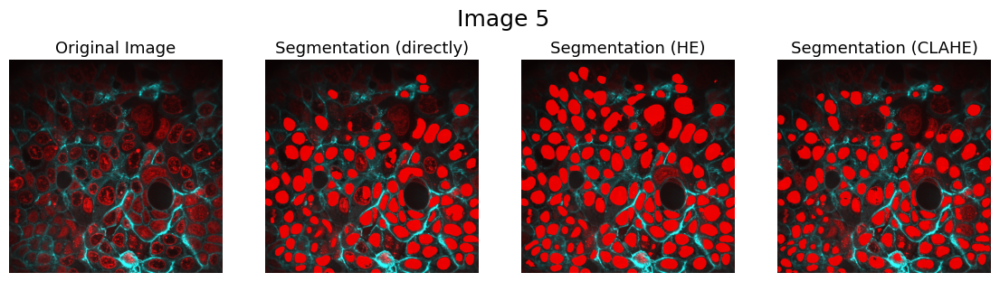

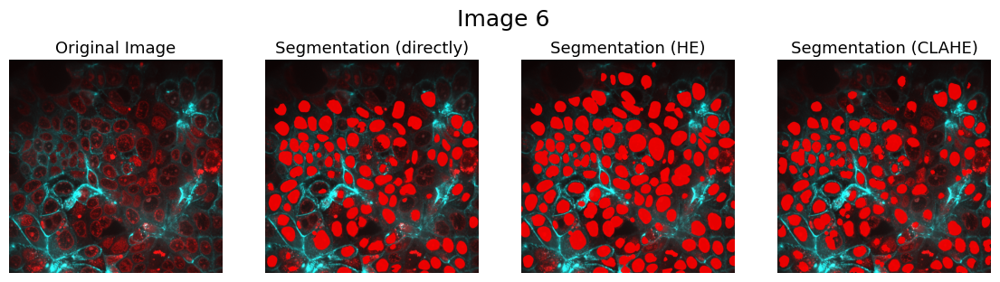

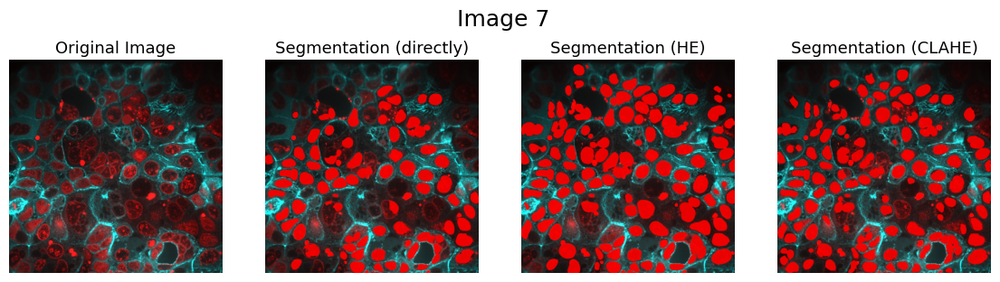

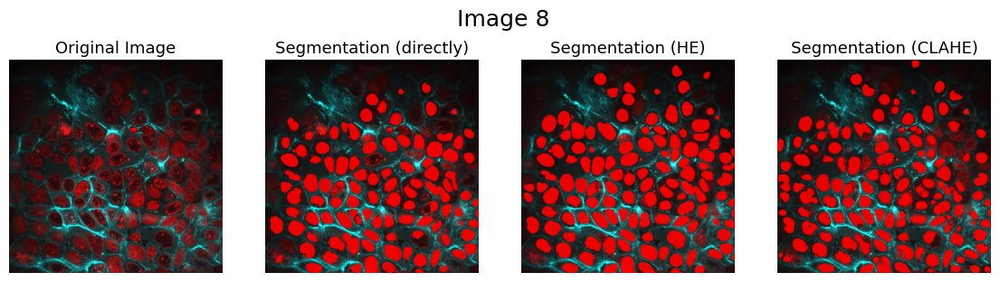

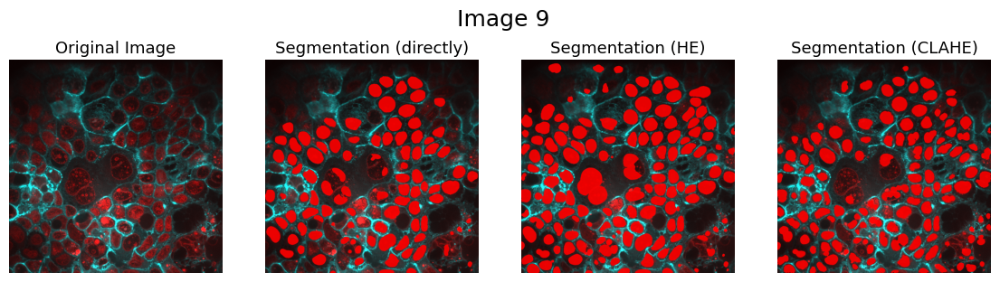

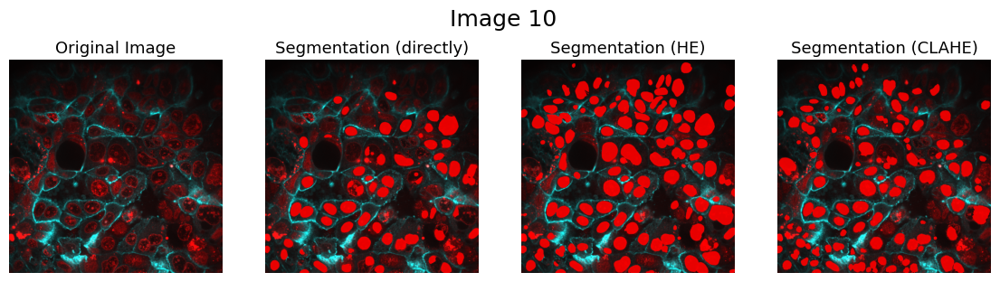

In [7]:
for i in range(len(Images)):
    
    fig, ax = plt.subplots(1, 4, figsize=(14, 10))

    ax[0].imshow(Images[i])
    ax[0].axis('off')
    ax[0].set_title('Original Image', fontsize=13)

    masks = nuclei[i]
    ax[1].imshow(Images[i])
    ax[1].imshow(masks, alpha = 0.9*(masks>0.01), cmap = custom_colormap())
    ax[1].axis('off')
    ax[1].set_title('Segmentation (directly)', fontsize=13)

    masks = nuclei_HE[i]
    ax[2].imshow(Images[i])
    ax[2].imshow(masks, alpha = 0.9*(masks>0.01), cmap = custom_colormap())
    ax[2].axis('off')
    ax[2].set_title('Segmentation (HE)', fontsize=13)

    masks = nuclei_CLAHE[i]
    ax[3].imshow(Images[i])
    ax[3].imshow(masks, alpha = 0.9*(masks>0.01), cmap = custom_colormap())
    ax[3].axis('off')
    ax[3].set_title('Segmentation (CLAHE)', fontsize=13)
    
    plt.suptitle(f'Image {i + 1}', x = 0.515, y = 0.67, fontsize = 18)

    plt.show()